# 06 — Zöllner Electrogravitation Coverage

The package exposes Weber's historical **electrogravitational** extension via `ZollnerOptions(enabled, a)`. When enabled, unlike-sign charge pairs get a coupling factor $\kappa_{ij} = 1 + a$; like-sign pairs get $\kappa_{ij} = 1$. The residual $(\kappa - 1)\,q_i q_j/r_{ij}$ is the extra gravity-like term.

This notebook exercises **every** `plot_zollner_*` function as well as the full standard plot set on a Zöllner-enabled run, and verifies that regularization is compatible with the extension (the $\kappa$ values pass through the pipeline transparently).

In [1]:
include(joinpath(@__DIR__, "common.jl"))

## 1. Build Weber and Zöllner problems from the canonical ICs

In [2]:
prob_weber   = canonical_2d_problem()
prob_zollner = canonical_2d_problem(
    zollner = ZollnerOptions(enabled = true, a = 0.05),
)

println("Weber kappas:   ", prob_weber.kappas)
println("Zöllner kappas: ", prob_zollner.kappas)
@assert prob_zollner.kappas[1] ≈ 1.05

Weber kappas:   

[1.0]
Zöllner kappas: [1.05]


In [3]:
sol_weber   = solve(prob_weber)
sol_zollner = solve(prob_zollner)
println("Weber retcode:   ", sol_weber.retcode,   "  steps = ", length(sol_weber.t))
println("Zöllner retcode: ", sol_zollner.retcode, "  steps = ", length(sol_zollner.t))

Weber retcode:   Success

  steps = 27142
Zöllner retcode: Success  steps = 27142


## 2. Standard plot set on the Zöllner solution

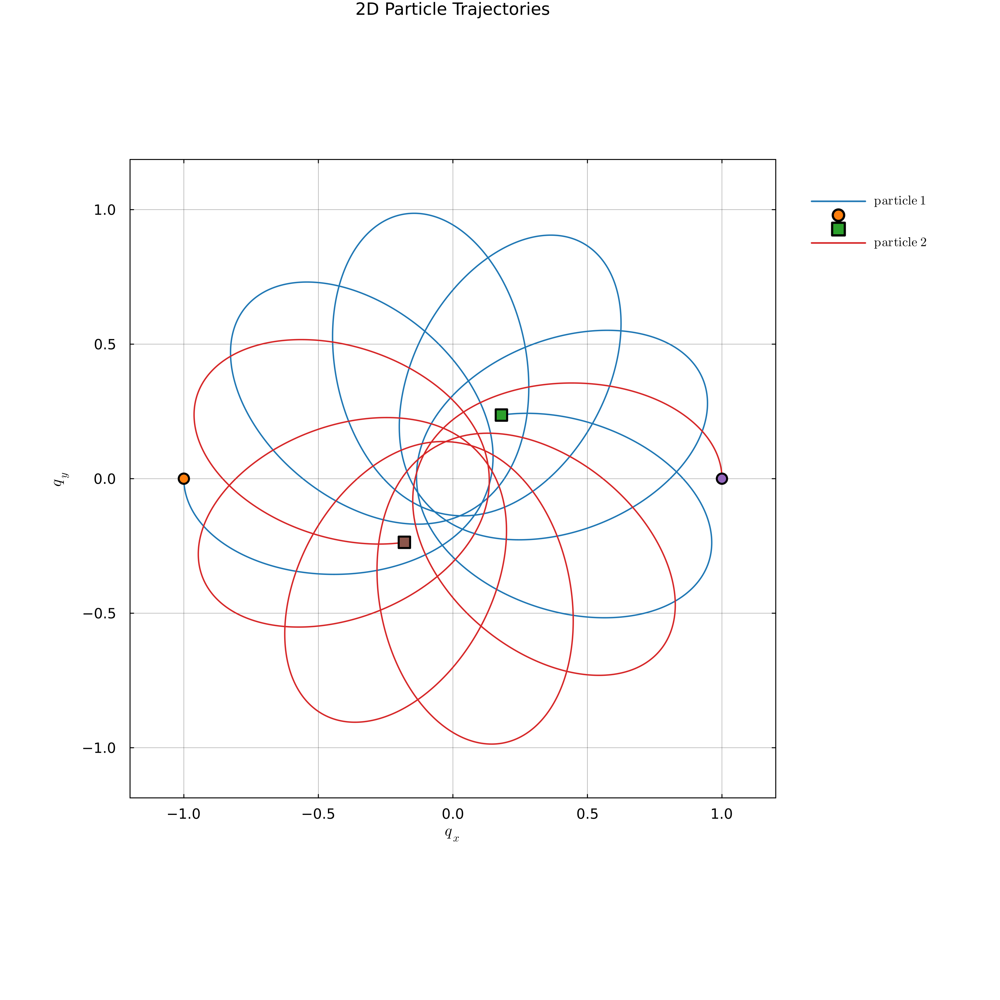

ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


In [4]:
traj_z = compute_trajectory_data(sol_zollner, 2, 2; stride = 10)
plot_trajectories(traj_z)

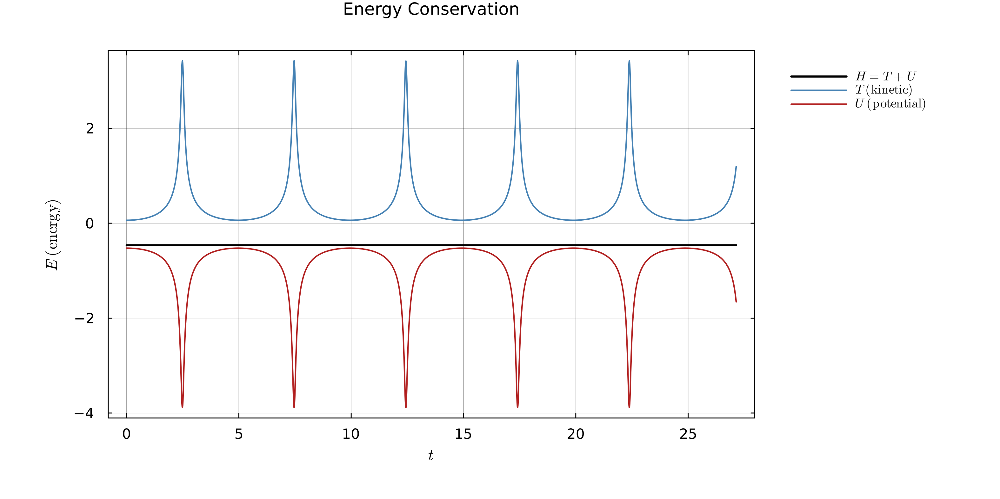

In [5]:
en_z = compute_energy_timeseries(sol_zollner; stride = 10)
plot_energy(en_z)

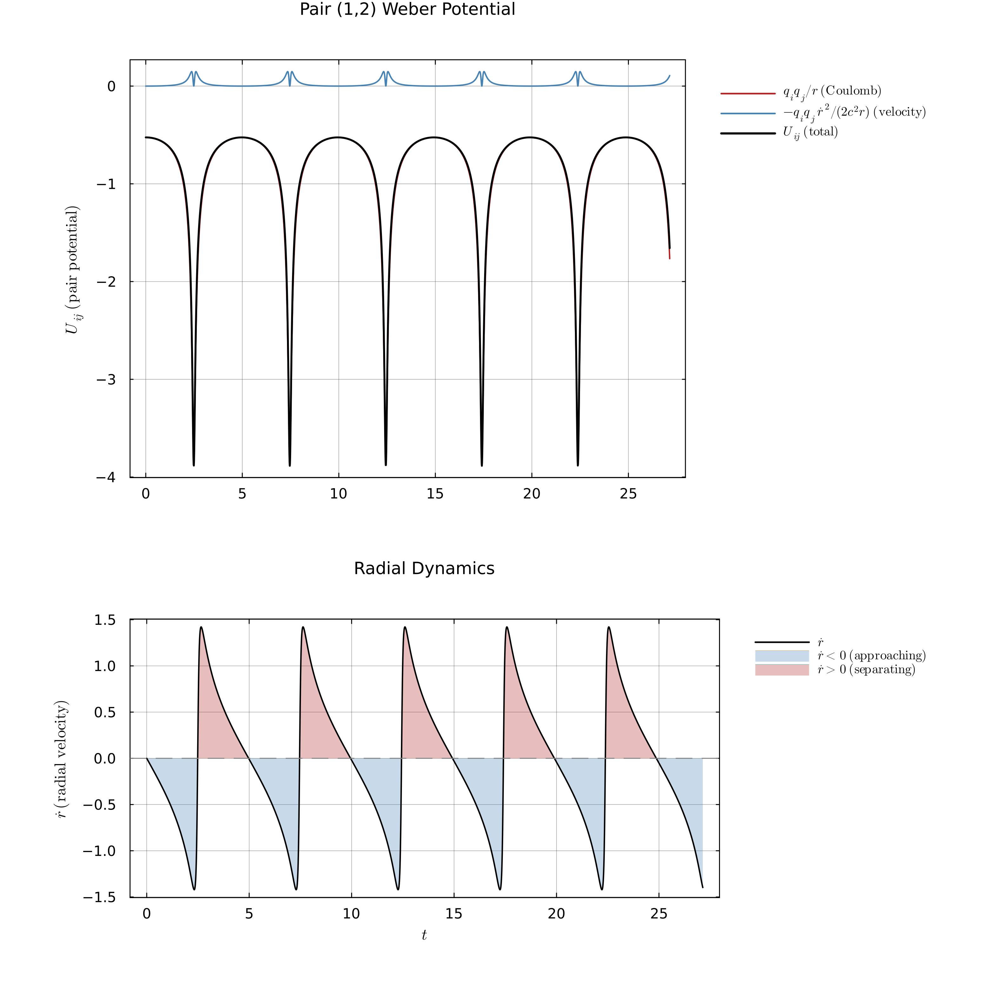

In [6]:
plot_pair_energy(en_z, (1, 2))

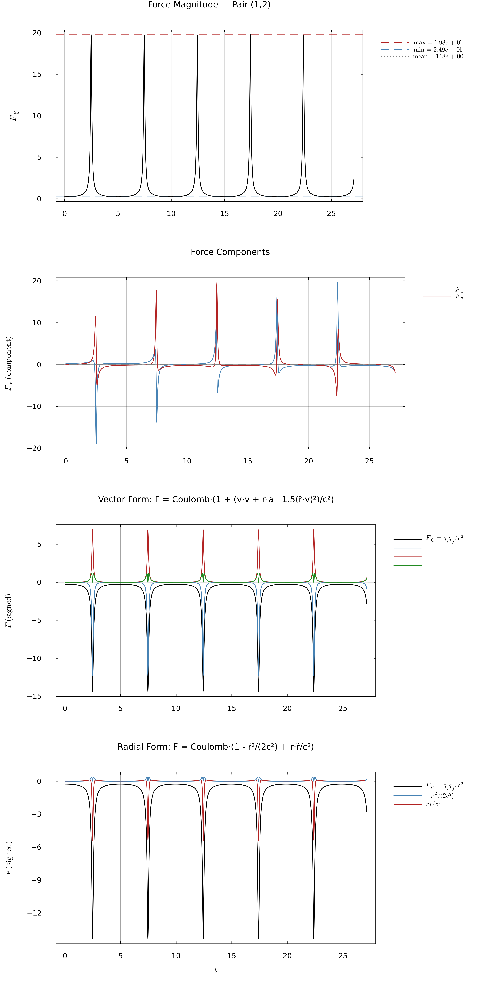

ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


In [7]:
forces_z = compute_pair_force_timeseries(sol_zollner, (1, 2), 2, 2,
    [M_CANON...], [Q_CANON_UNLIKE...], C_CANON; stride = 10)
plot_pair_forces(forces_z)

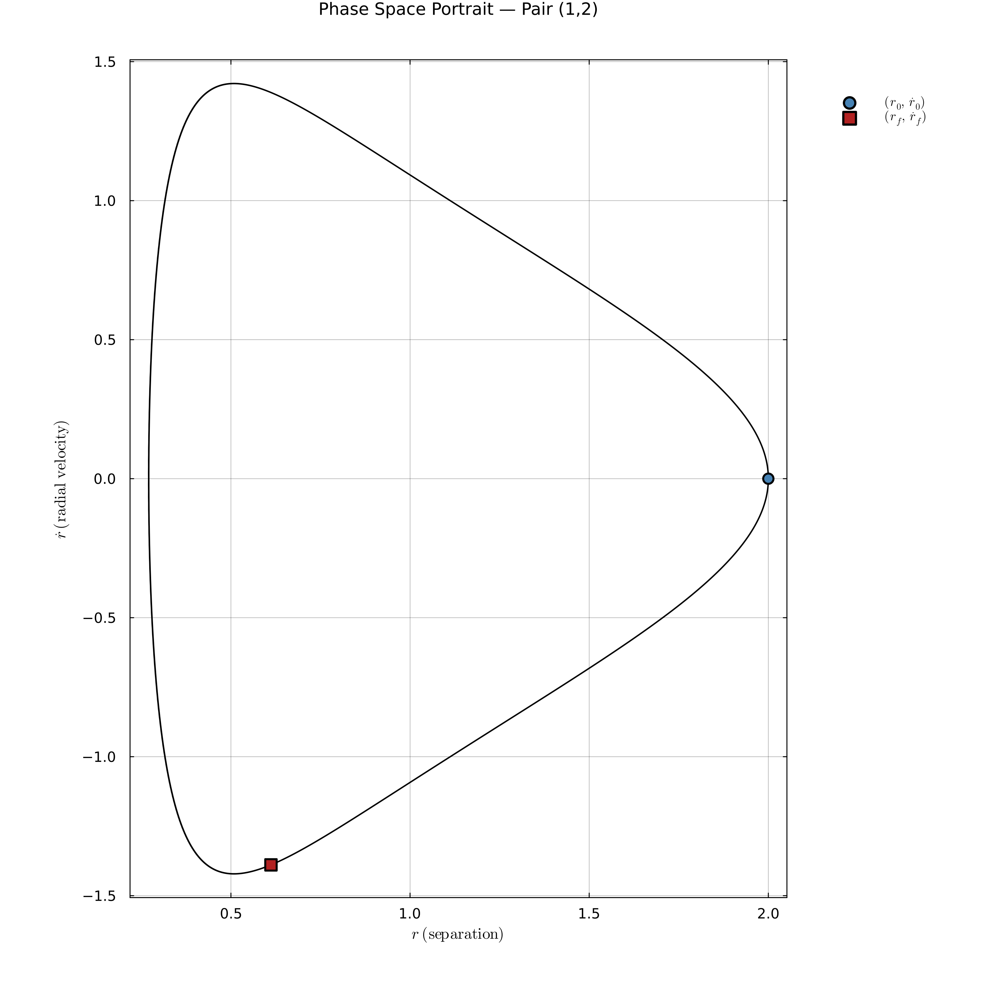

In [8]:
plot_phase_space(forces_z)

## 3. Zöllner-specific plots

- `plot_zollner_energy` — two panels: total $U$ with per-pair $\kappa$ overlays, and the aggregate Zöllner residual $\sum \Delta U^Z$ vs total $H$.
- `plot_zollner_force_residual` — force magnitude $\|F\|$ vs the extra $|(\kappa - 1)\,F_C|$, plus the ratio $\|\Delta F^Z\|/\|F\|$ against the $a$ reference.

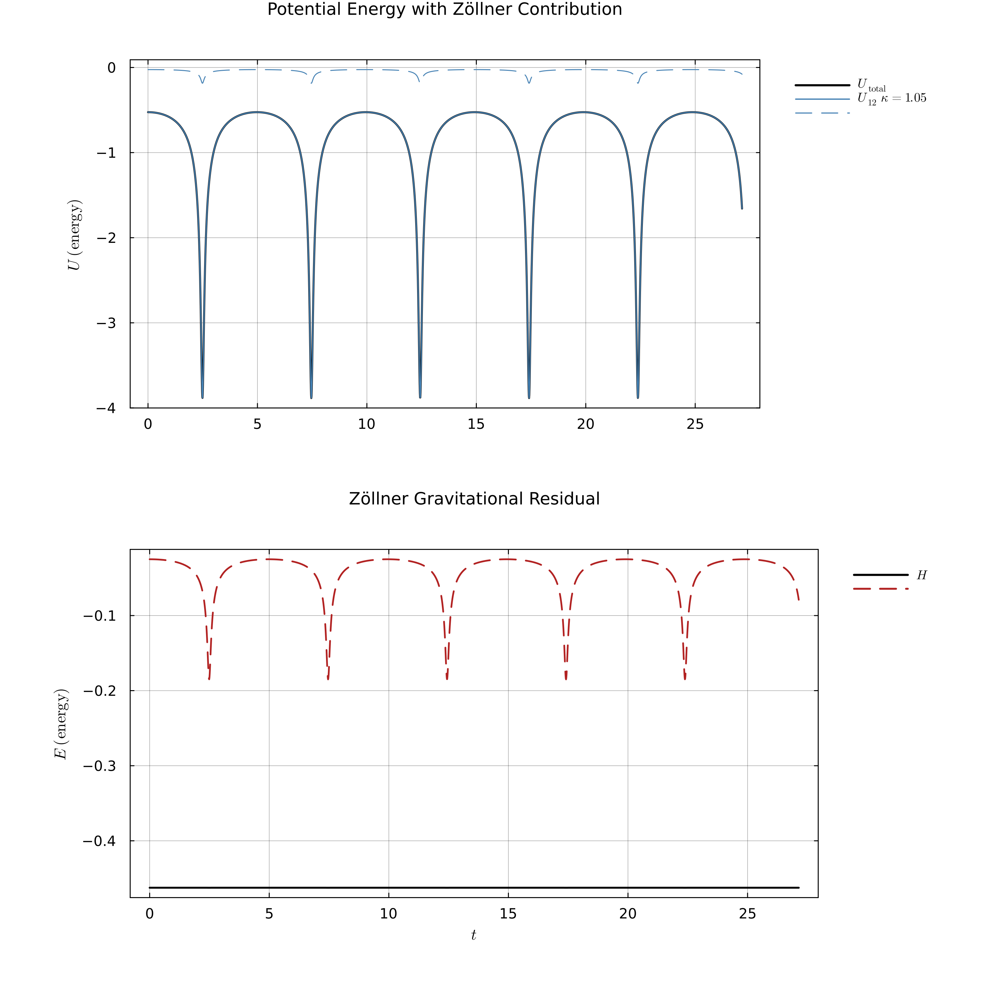

ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


In [9]:
plot_zollner_energy(en_z)

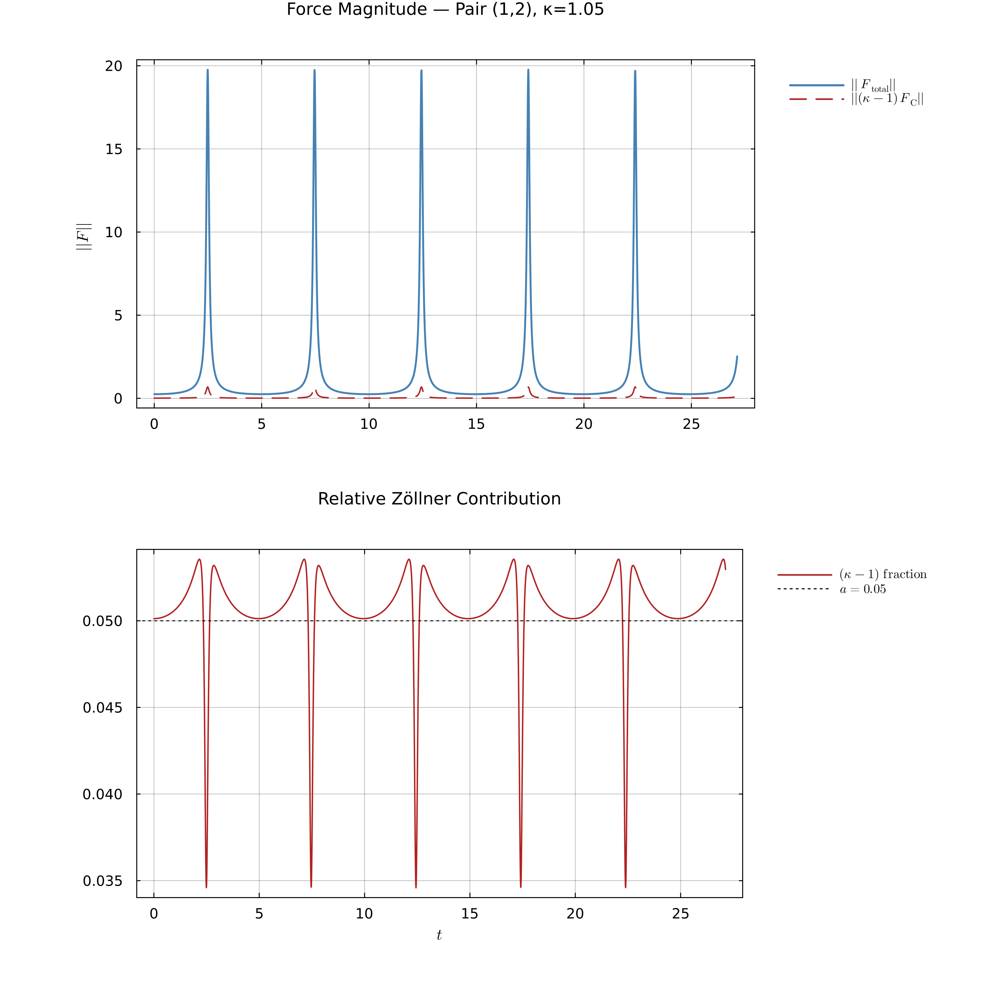

ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


In [10]:
plot_zollner_force_residual(forces_z)

## 4. Overlay comparisons

Visualize how a small mismatch $a = 0.05$ perturbs the orbit relative to plain Weber.

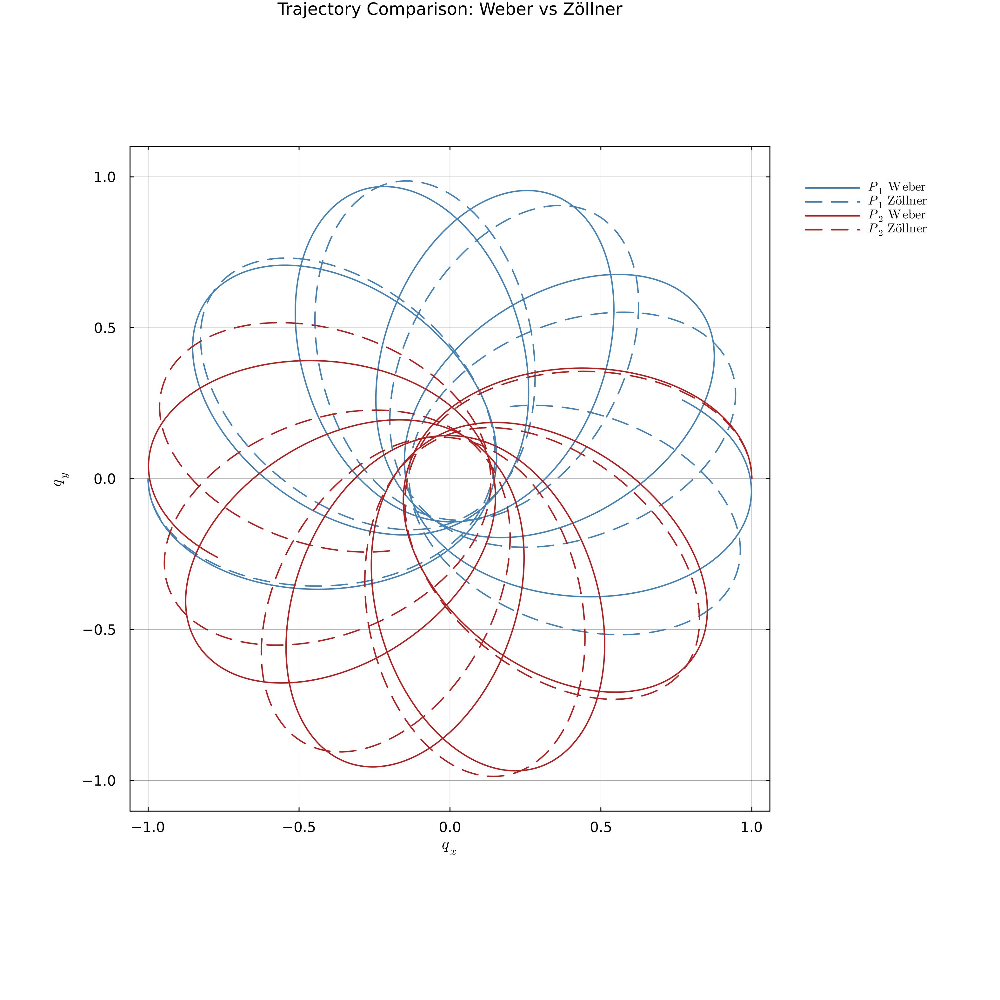

In [11]:
plot_weber_vs_zollner(sol_weber, sol_zollner)

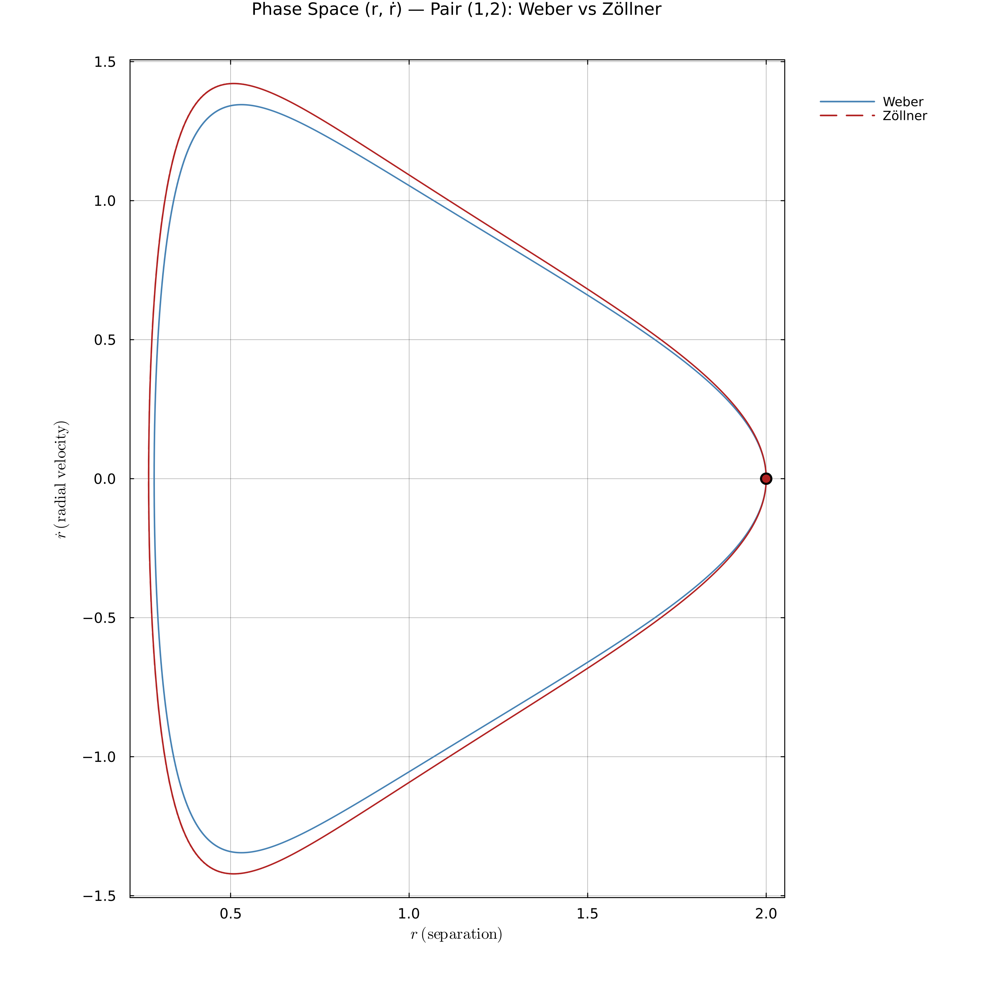

In [12]:
forces_w = compute_pair_force_timeseries(sol_weber, (1, 2), 2, 2,
    [M_CANON...], [Q_CANON_UNLIKE...], C_CANON; stride = 10)
plot_zollner_phase_space(forces_w, forces_z)

## 5. Regularization + Zöllner compatibility

Enable `:lifted_pair` on top of the Zöllner problem. The $\kappa_{ij}$ values flow through the regularized kernel as a pass-through coupling, so everything should work.

[zollner+lifted] retcode                  = Success
[zollner+lifted] requested_backend        = lifted_pair


[zollner+lifted] used_backend             = lifted_pair
[zollner+lifted] active_steps             = 2220
[zollner+lifted] pair_steps               = 2220
[zollner+lifted] adaptive_pair_steps      = 0
[zollner+lifted] lifted_pair_steps        = 2220
[zollner+lifted] chain_steps              = 0
[zollner+lifted] unregularized_steps      = 24921
[zollner+lifted] backend_fallback_steps   = 0
[zollner+lifted] total_substeps           = 30296
[zollner+lifted] max_substeps_used        = 3
[zollner+lifted] activation_count         = 5
[zollner+lifted] deactivation_count       = 5
[zollner+lifted] min_encounter_distance   = 0.27027
[zollner+lifted] max_constraint_violation = 0.000e+00
Energy drift (regularized Zöllner): 2.529e-04 %


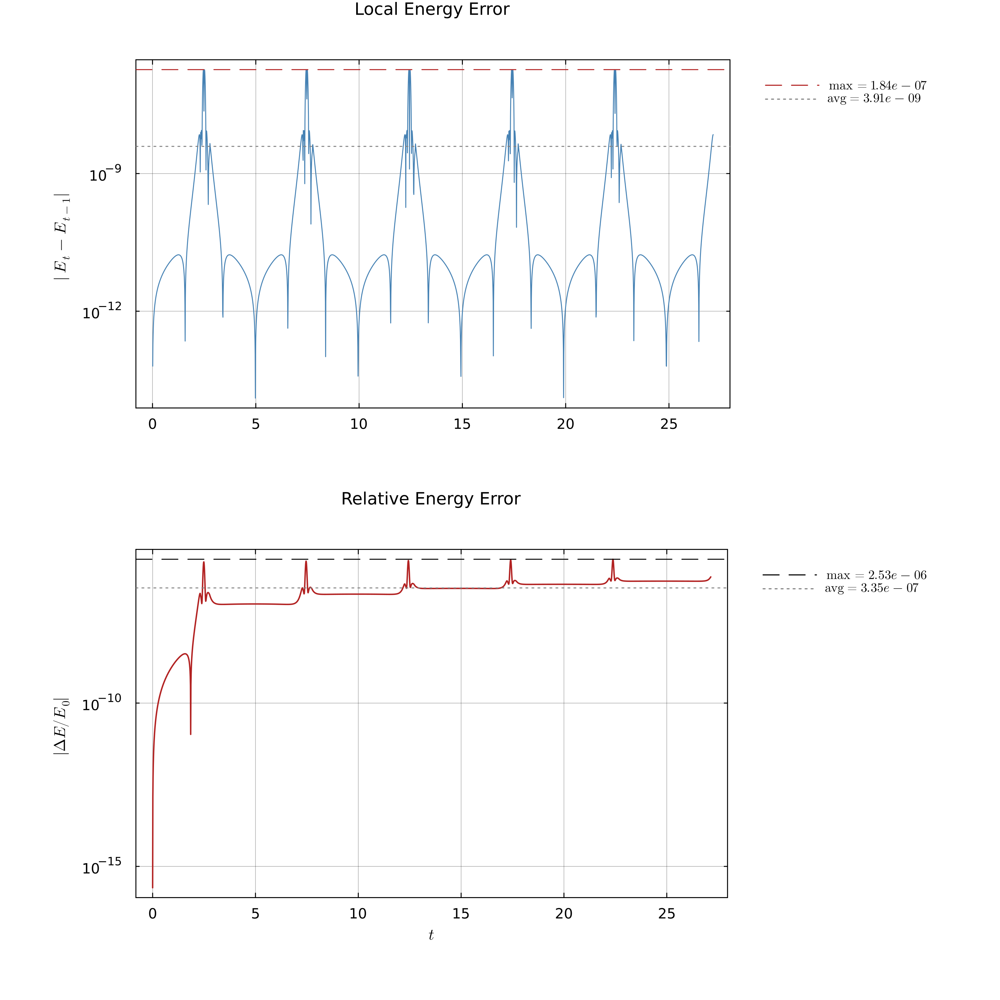

In [13]:
prob_zollner_reg = canonical_2d_problem(
    zollner        = ZollnerOptions(enabled = true, a = 0.05),
    regularization = RegularizationOptions(
        enabled = true, backend = :lifted_pair, r_on = 0.5, r_off = 0.7,
    ),
)

sol_zollner_reg = solve(prob_zollner_reg)
print_reg_diagnostics(sol_zollner_reg; label = "zollner+lifted")

en_zr = compute_energy_timeseries(sol_zollner_reg; stride = 10)
@printf("Energy drift (regularized Zöllner): %.3e %%\n", en_zr.statistics.global_error_percent_max)
plot_energy_errors(en_zr)

**Takeaway.** Zöllner is a problem-level constant (per-pair $\kappa$), not a regularization-level option. The regularized kernel is $\kappa$-agnostic and the diagnostics are identical to a plain Weber regularized run — see the matching `pair_steps` / `lifted_pair_steps` counts between this notebook and [`01_reference_replication.ipynb`](01_reference_replication.ipynb).